<a href="https://colab.research.google.com/github/ImeshaDilshani/Sign-Language-Detection-Computer-Vision-YOLO-v5/blob/main/Sign_Language_Detection_YOLO_v5_Computer_Vision_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sign Language Detection Computer Vision YOLO v5

GROUND TRUTH TRAINING DATA:


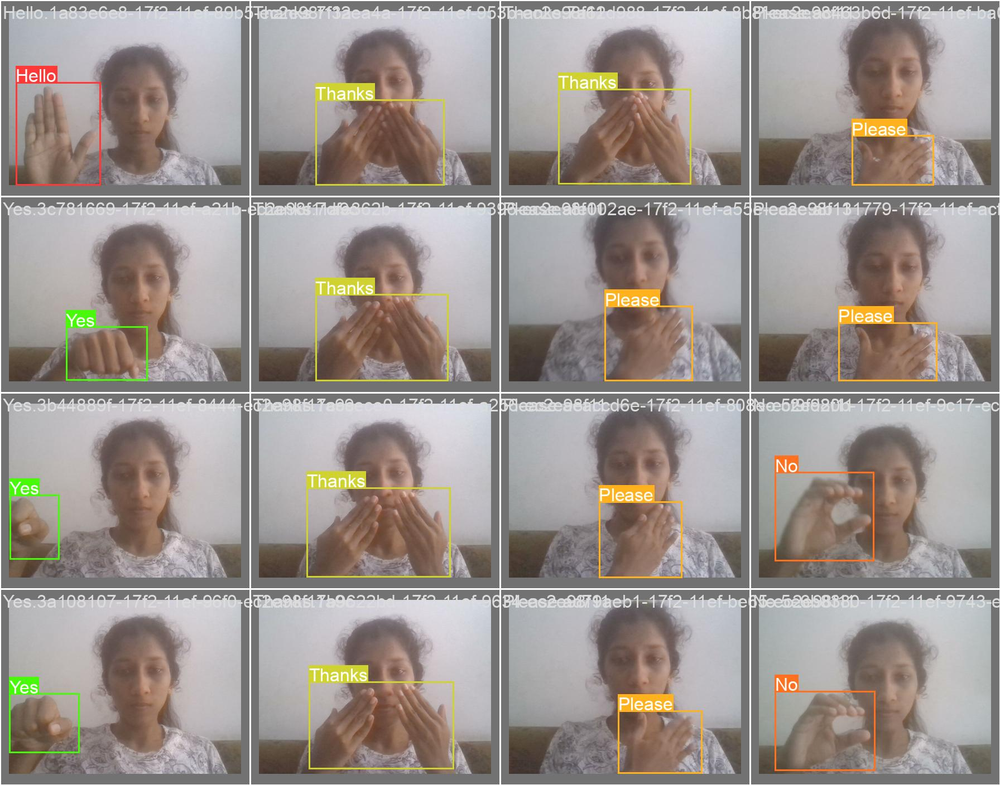

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results5/val_batch0_labels.jpg', width=900)

# YOLO v5 Instalation
- Documantation - https://docs.ultralytics.com/yolov5/quickstart_tutorial/
- YOLO v5 GitHub - https://github.com/ultralytics/yolov5

In [ ]:
# clone YOLO v5 repo
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 16623, done.
remote: Counting objects: 100% (101/101), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 16623 (delta 57), reused 65 (delta 29), pack-reused 16522
Receiving objects: 100% (16623/16623), 15.15 MiB | 18.82 MiB/s, done.
Resolving deltas: 100% (11410/11410), done.


In [ ]:
%cd yolov5

/content/yolov5


# Data Collection

**PyTorch** is being used here likely **because the task involves deep learning, specifically training a YOLOv5 object detection model.** PyTorch is a widely used deep learning framework known for its flexibility and ease of use, particularly for research and development in the field of deep learning.

- Here's why PyTorch is suitable for this task:

- **Flexibility:** PyTorch provides a dynamic computational graph, allowing for more flexibility in model construction and experimentation compared to static graph frameworks like TensorFlow. This flexibility is especially useful during model development and debugging.

- **Ease of use:** PyTorch offers an intuitive and Pythonic API, making it easier for researchers and developers to write and debug deep learning code. Its syntax is similar to NumPy, which is familiar to many developers.

- **Large community and ecosystem:** PyTorch has a large and active community, which means there are plenty of tutorials, documentation, and pre-trained models available. This makes it easier to find resources and get help when encountering issues.

- **GPU acceleration:** PyTorch seamlessly integrates with CUDA, allowing for GPU acceleration during training and inference. This can significantly speed up deep learning tasks, especially when working with large datasets or complex models like YOLOv5.

Overall, PyTorch is a suitable choice for deep learning tasks like training object detection models due to its flexibility, ease of use, and strong community support.

In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.3.0+cu121 CPU


Steps in Detail

- Change Directory
- Download Data
- Extract Data
- Cleanup

Downloadable data set link - https://github.com/ImeshaDilshani/Sign-Language-Detection-Computer-Vision-YOLO-v5/raw/main/Sign_language_data.zip

In [ ]:

%cd /content
!curl -L "https://github.com/ImeshaDilshani/Sign-Language-Detection-Computer-Vision-YOLO-v5/raw/main/Sign_language_data.zip" > SignData.zip; unzip SignData.zip; rm SignData.zip


/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 7988k  100 7988k    0     0  13.8M      0 --:--:-- --:--:-- --:--:-- 13.8M
Archive:  SignData.zip
  inflating: Sign_language_data/data.yaml  
   creating: Sign_language_data/test/
   creating: Sign_language_data/test/Images/
  inflating: Sign_language_data/test/Images/Hello.1a83e6e8-17f2-11ef-89b5-ec2e98f11a9c.jpg  
  inflating: Sign_language_data/test/Images/Hello.1bb80a23-17f2-11ef-918e-ec2e98f11a9c.jpg  
  inflating: Sign_language_data/test/Images/Hello.1cecec9f-17f2-11ef-b6cd-ec2e98f11a9c.jpg  
  inflating: Sign_language_data/test/Images/Hello.1e216526-17f2-11ef-8593-ec2e98f11a9c.jpg  
  inflating: Sign_language_data/test/Images/Hello.1f559c66-17f2-11ef-8b2f-ec2e98f11a9c.jpg  
  inflating: Sign_language_data/test/Images/IloveYou.8ddf3c7

In [ ]:
# move extract folder to root directory
%mv Sign_language_data/test ./
%mv Sign_language_data/train ./
%mv Sign_language_data/data.yaml ./

In [ ]:
#display the contents
%cat data.yaml

train: ../train/Images
val: ../test/Images

nc: 6
names: ['Hello', 'IloveYou', 'No', 'Please', 'Thanks', 'Yes']


# Define Model Configuration and Architecture



*   Import the yaml module
*   Open the data.yaml file
*   Load the YAML file
*   Extract the number of classes



In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
num_classes

'6'

It will output the content of the yolov5s.yaml file located in the /content/yolov5/models/ directory. This file typically contains the configuration settings for the YOLOv5s model, which is a variant of the YOLOv5 object detection model.

In [ ]:
#this is the model configuration we will use
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 30 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results  --cache


/content/yolov5
2024-05-23 14:16:53.850055: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-23 14:16:53.850133: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-23 14:16:53.853297: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=./models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, devic

# Evaluate Custom YOLOv5 Detector Performance

In [ ]:

# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 25142), started 0:00:09 ago. (Use '!kill 25142' to kill it.)

<IPython.core.display.Javascript object>

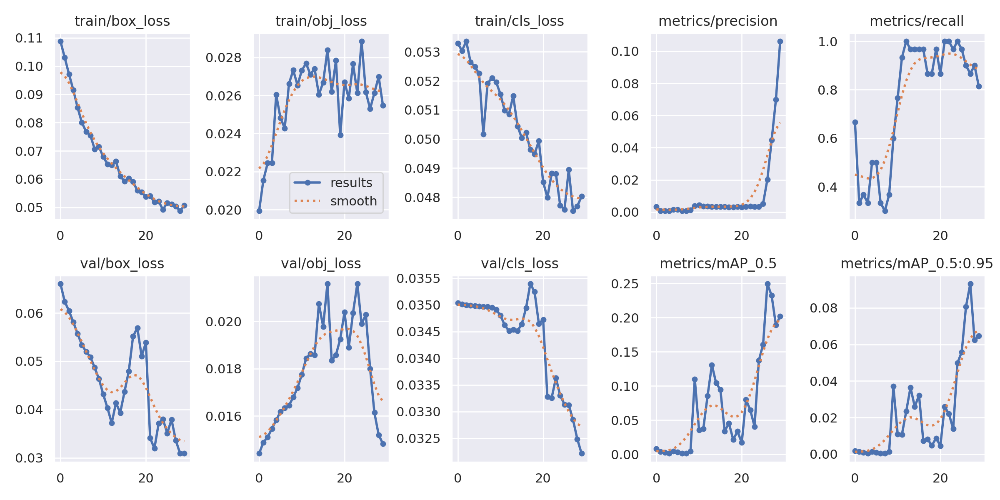

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results5/results.png', width=1000)  # view results.png

# Visualize Our Training Data with Labels

GROUND TRUTH TRAINING DATA:


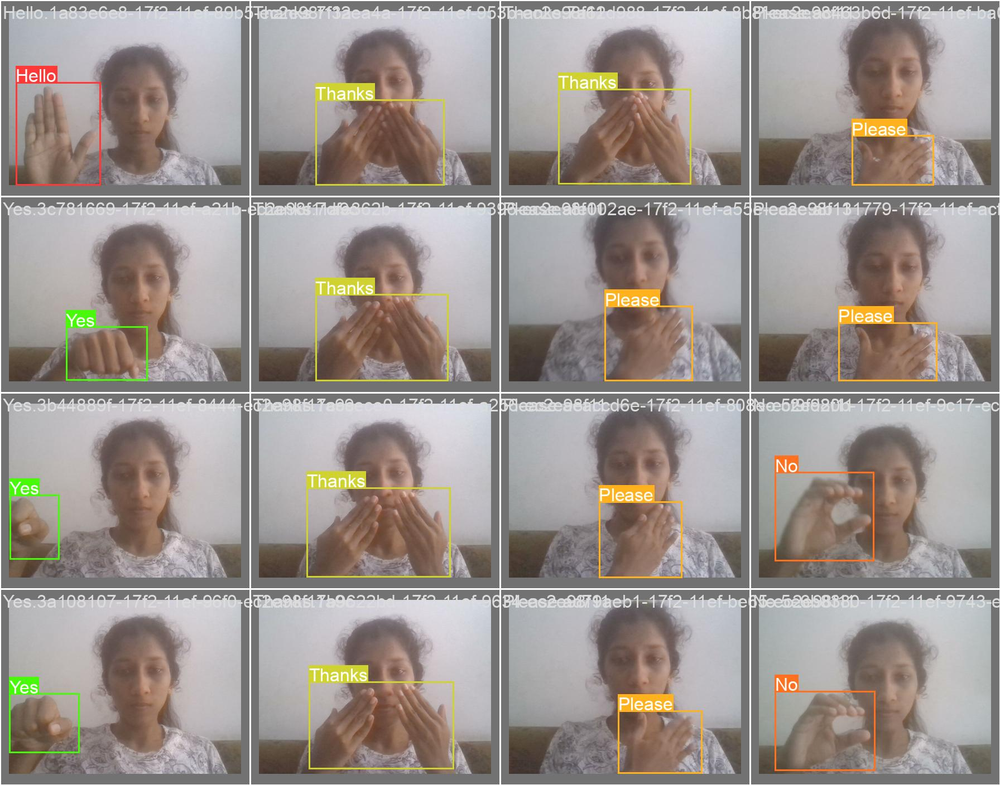

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results5/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


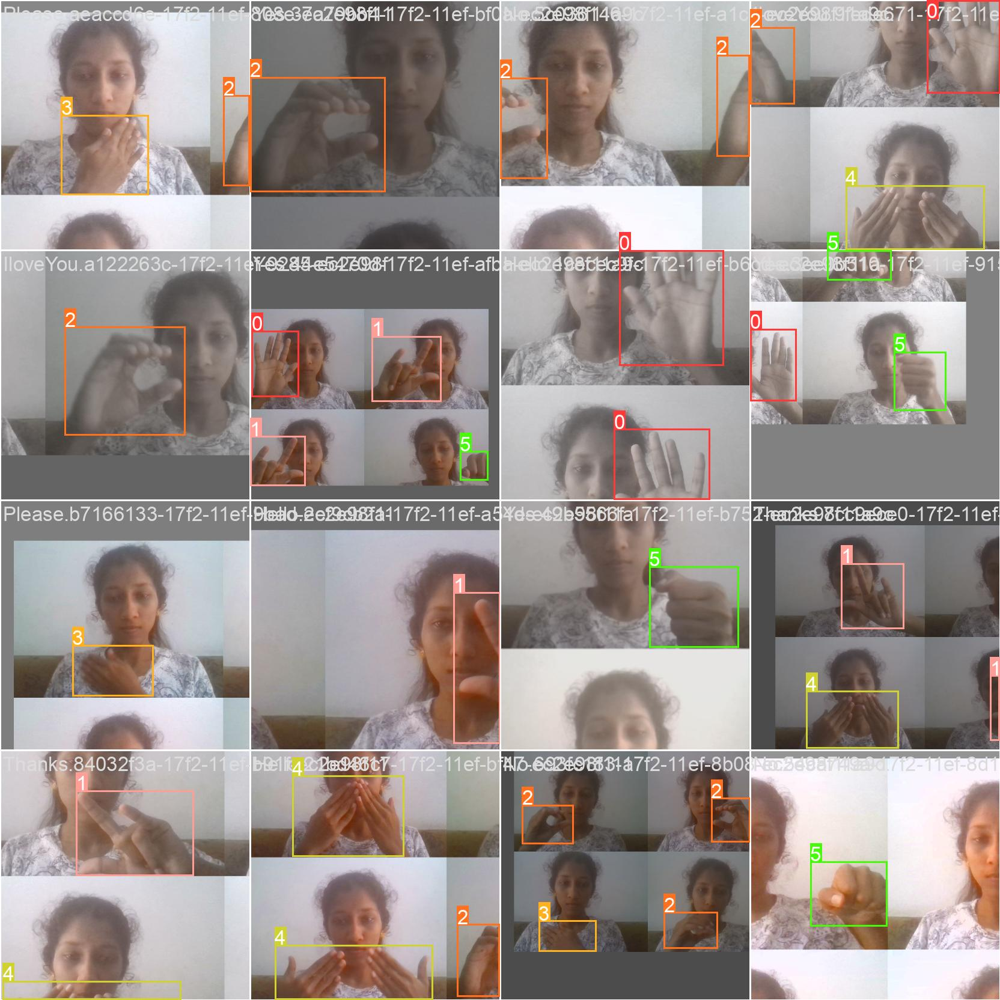

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results5/train_batch0.jpg', width=900)

# Run Inference With Trained Weights

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results5/weights/best.pt --img 416 --conf 0.1 --source ../test/images


/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5s_results5/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-313-g712de55a Python-3.10.12 torch-2.3.0+cu121 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7260003 parameters, 0 gradients
image 1/30 /content/test/images/Hello.1a83e6e8-17f2-11ef-89b5-ec2e98f11a9c.jpg: 320x416 (no detections), 178.2ms
image 2/30 /content/test/images/Hello.1bb80a23-17f2-11ef-918e-ec2e98f11a9c.jpg: 320x416 (no detections), 150.0ms
image 3/30 /content/test/images/Hello.1cecec9f-17f2-11ef-b6cd-ec2e98f11a9c.jpg: 320x416 (no 

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")